## Initialization

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import pickle
import random

import laneline
from image_functions import *
from pipeline import *

from collections import deque
from moviepy.editor import VideoFileClip

%matplotlib inline

In [2]:
path = '/home/bruno/Documents/eLearning/CarND/CarND-Advanced-Lane-Lines'

## Custom Functions

To keep this norebook cleaner all custom functions were provided in separate .py files.
- image_functions.py contains functions related for image transformations
- laneline.py contains the line class
- pipeline.py contains the functions that combines all these tools to locate and draw the lanelines

## Camera Calibration

### Data Visualization

First we will load all images from the calibration folder and plot a few to get a feeling about the images we will be working with.

In [3]:
calib_imgs, calib_fn = read_all_imgs(path + '/camera_cal/')

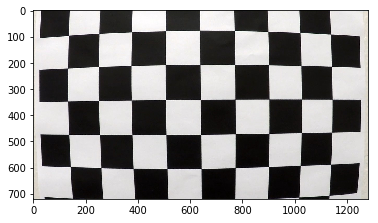

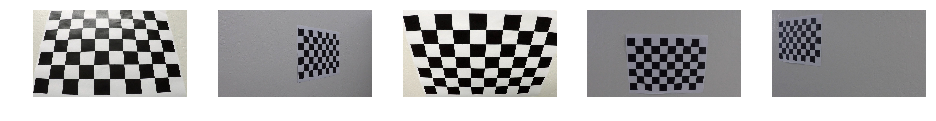

In [4]:
plt.imshow(calib_imgs[3])

rnd_idx = random.sample(range(len(calib_imgs)), 5)
implot = plt.figure(figsize=(16,16))

for i in range(5):
    ax = implot.add_subplot(1,5,i+1)
    ax.grid(False)
    ax.axis('off')
    ax.imshow(calib_imgs[rnd_idx[i]])

plt.show()

The images confirm that the checkerboard pattern we will be using to calibrate our camera is 9x6.

In [5]:
pattern = (9,6)
camera_params = calibrate_camera(calib_imgs, pattern)

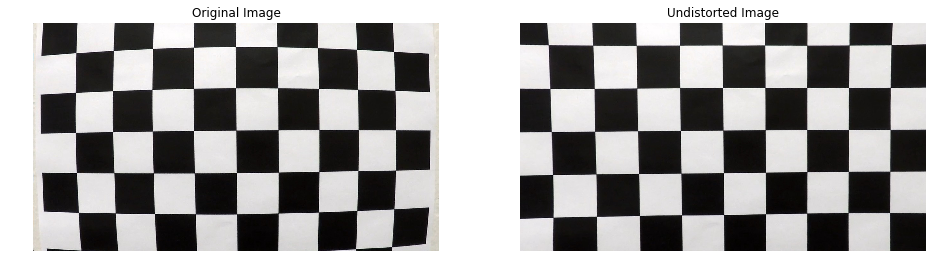

In [6]:
ref_img = calib_imgs[3]
correct_and_plot(ref_img, camera_params)

We can see that all edges are straight on our test image above, confirming that our calibration has been propriately done. We will save the camera calibration parameters so we don't need to do this every time we run our pipeline.

In [ ]:
#pickle.dump(camera_params, open(path + '/camera_params.pkl', 'wb'))

In [7]:
camera_params = pickle.load(open(path + '/camera_params.pkl', 'rb'))

## Tools for Lane Finding Pipeline

### Check camera calibration

We will begin by importing all test images and plotting the original and the undistorted versions of all images to ensure we have the right camera calibration parameters.

In [8]:
tst_imgs, tst_fn = read_all_imgs(path + '/test_images/')

In [9]:
dst_imgs = []

for img in tst_imgs:
    dst = undistort_image(img, camera_params)
    dst_imgs.append(dst)

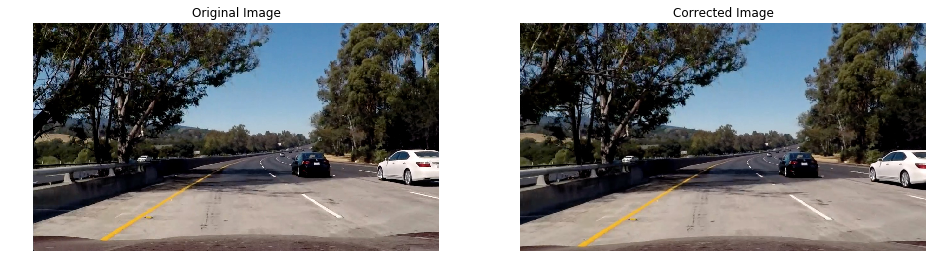

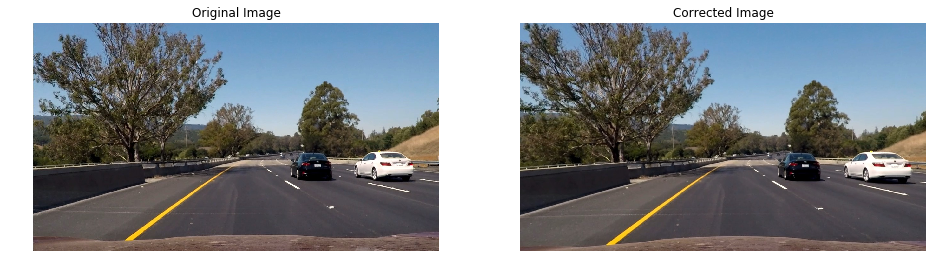

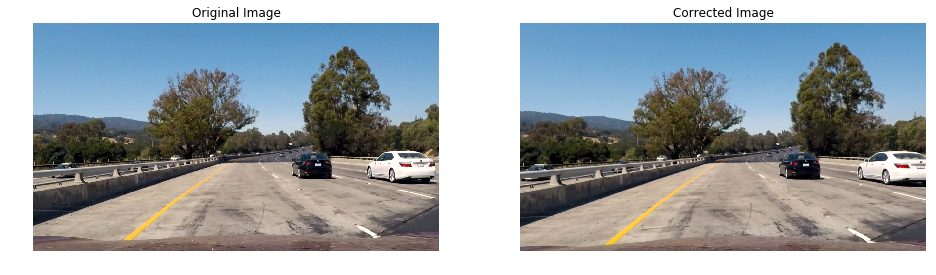

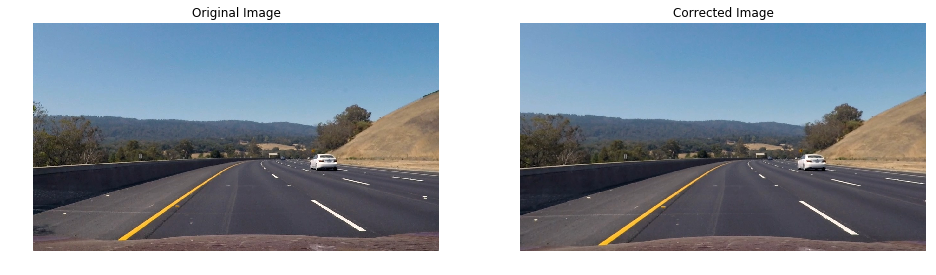

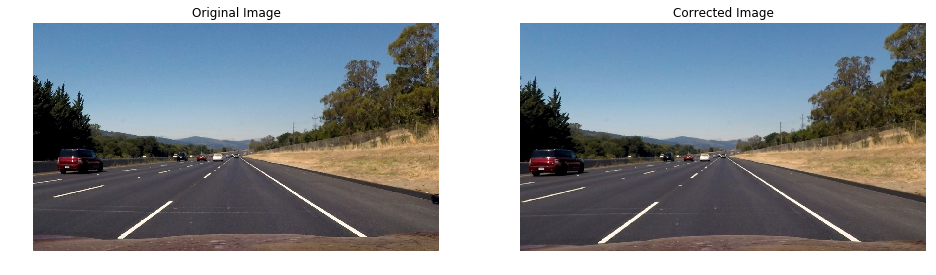

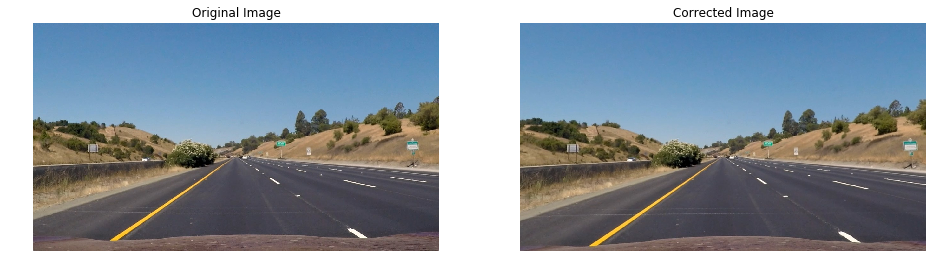

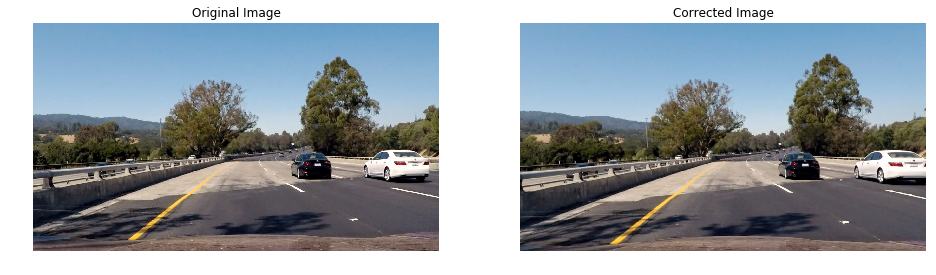

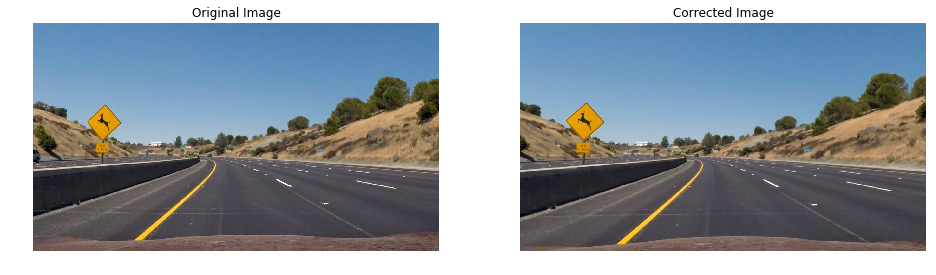

In [10]:
for img1, img2 in zip(tst_imgs, dst_imgs):
    plot_two(img1, img2, 'Original Image', 'Corrected Image')

### Changing the color space

In [11]:
cmask = []; dst_bin = []

for img in dst_imgs:
    color_masked = color_mask(img, return_bin=False)
    binary = color_mask(img, return_bin=True)
    cmask.append(color_masked)
    dst_bin.append(binary)

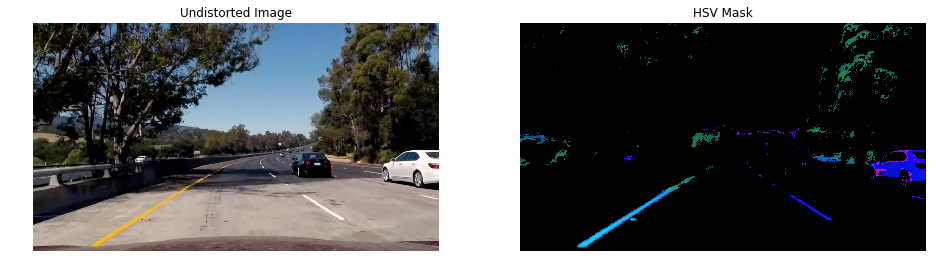

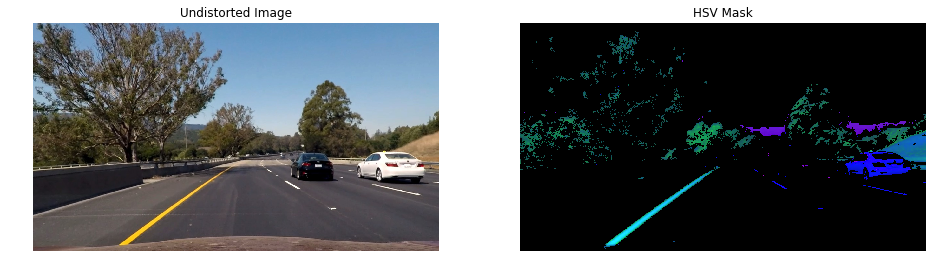

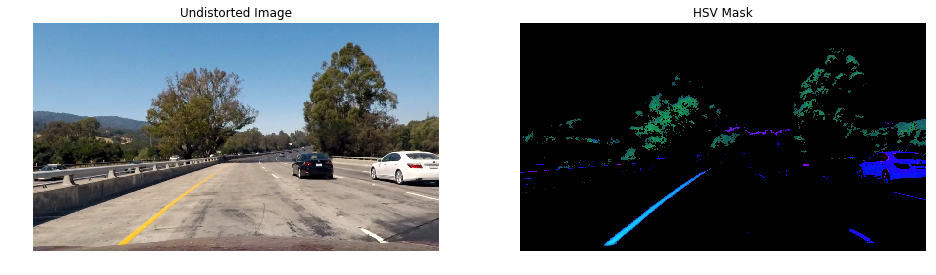

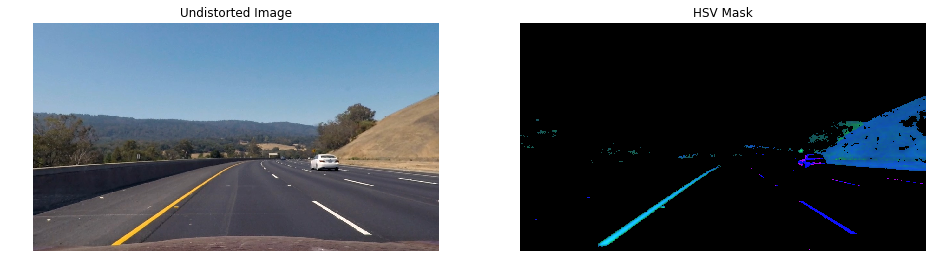

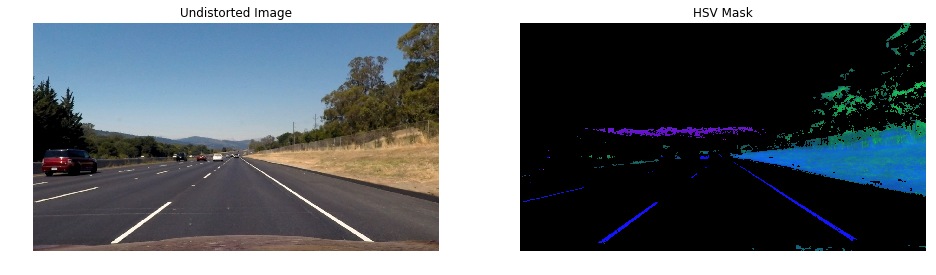

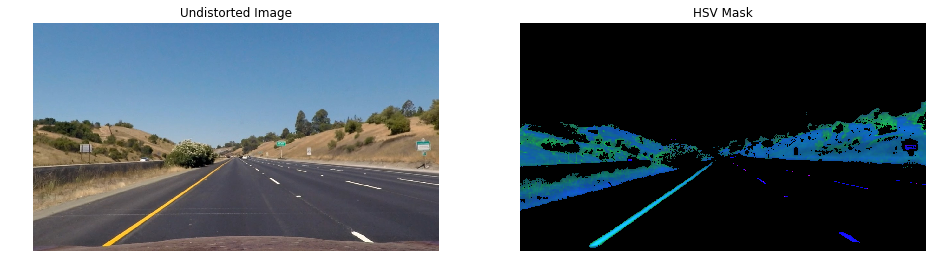

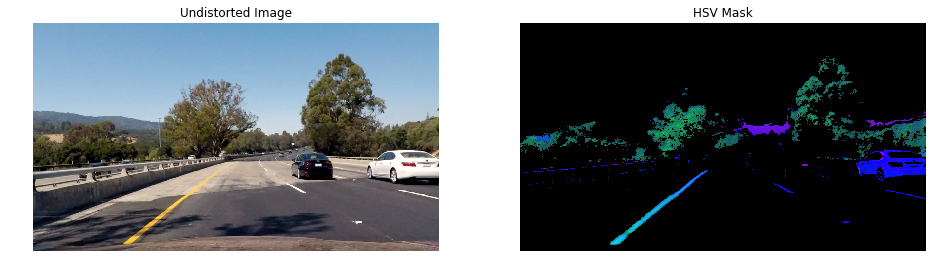

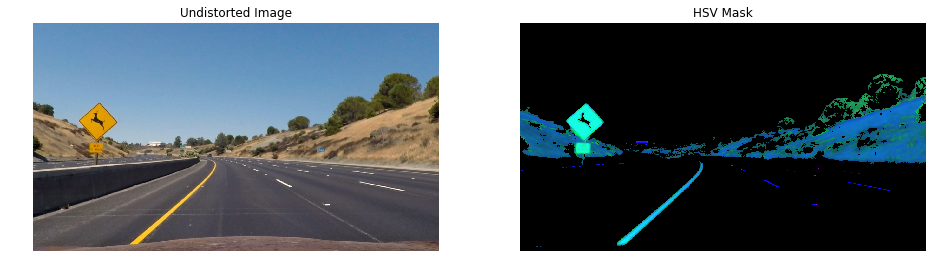

In [12]:
for img1, img2 in zip(dst_imgs, cmask):
    plot_two(img1, img2, 'Undistorted Image', 'HSV Mask', cmap2='gray')

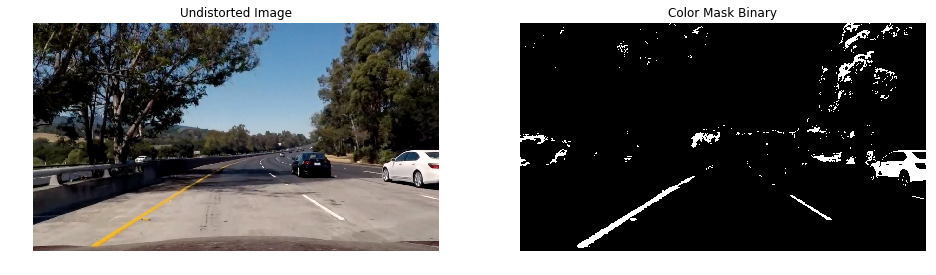

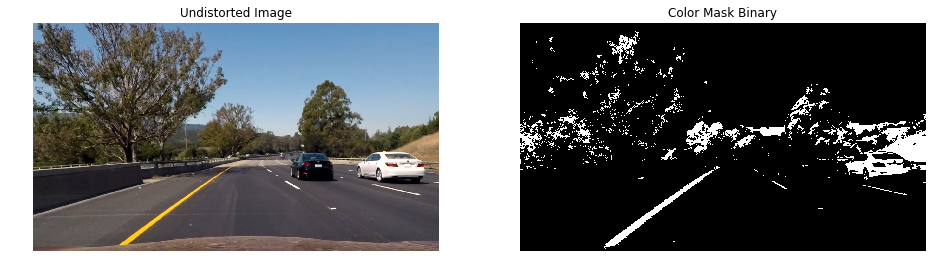

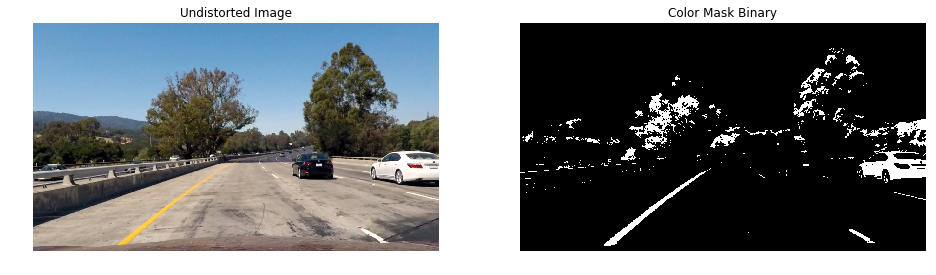

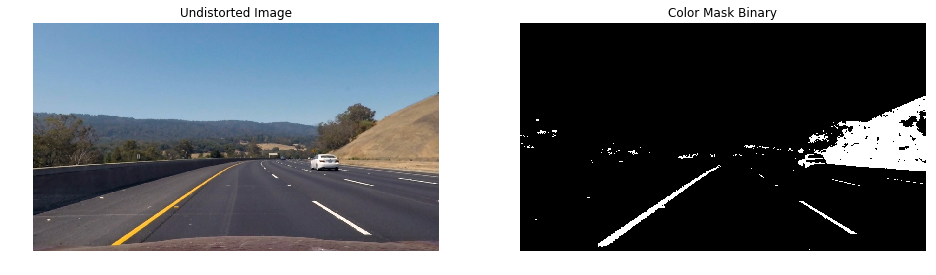

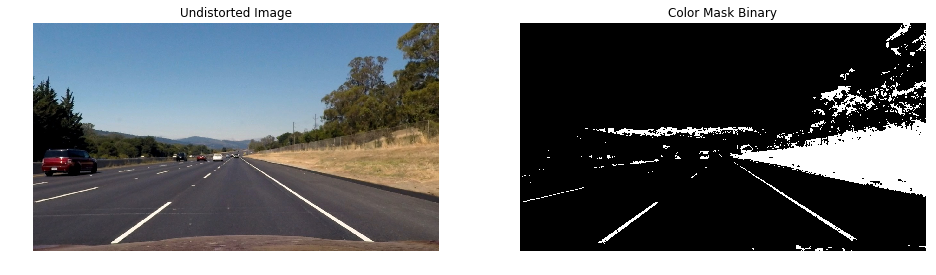

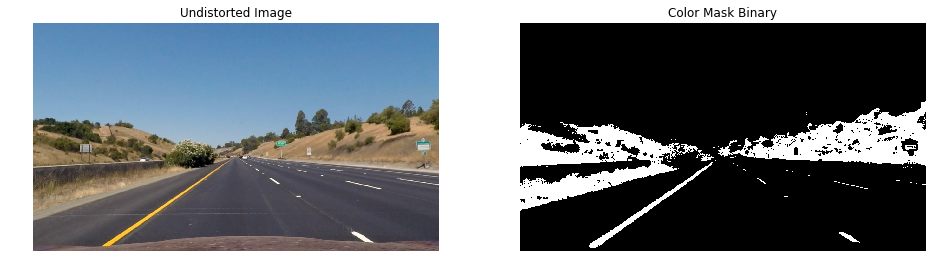

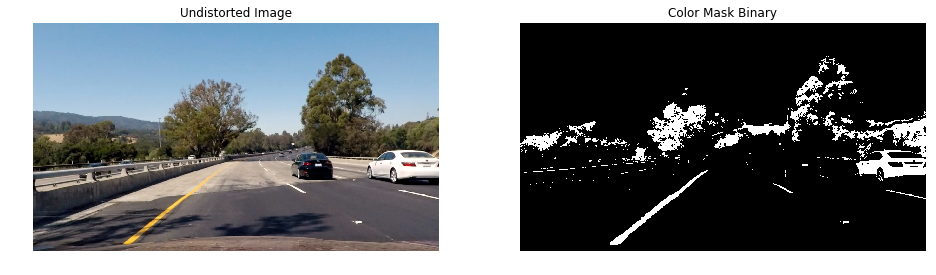

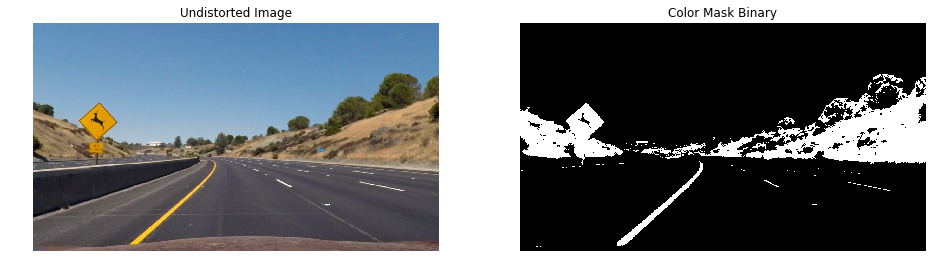

In [13]:
for img1, img2 in zip(dst_imgs, dst_bin):
    plot_two(img1, img2, 'Undistorted Image', 'Color Mask Binary', cmap2='gray')

### Sobel Transform

We will apply the sobel operator to the color masked image rather than the raw RGB image. This will enhance the performance of this mask since we have already removed a lot of unwanted information on the step above.

In [14]:
sobel_bin = []
for img in cmask:
    sobel_binary = sobel(img, input_format='HSV')
    sobel_bin.append(sobel_binary)

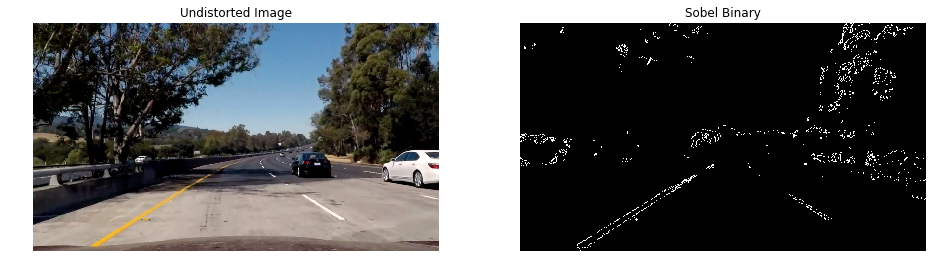

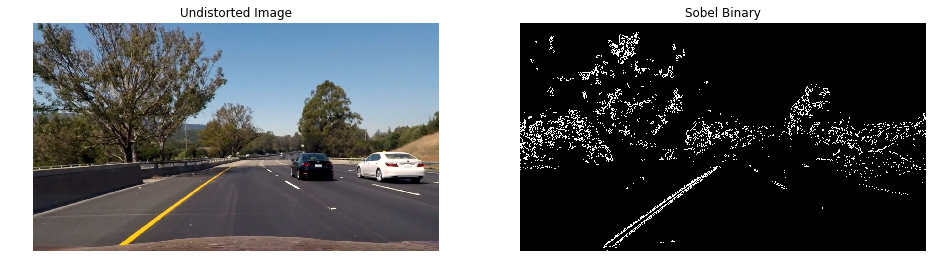

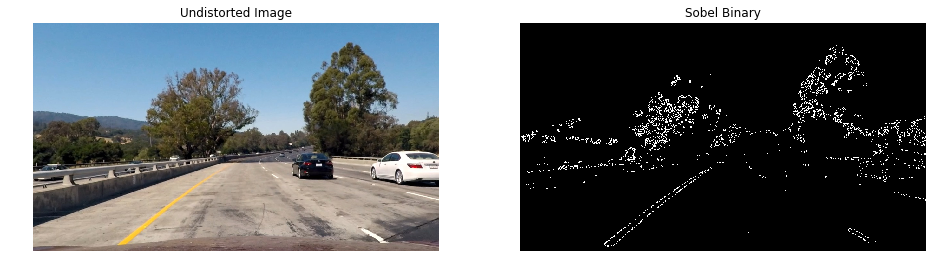

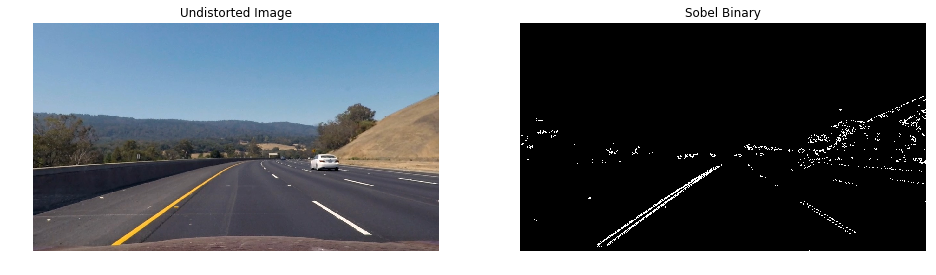

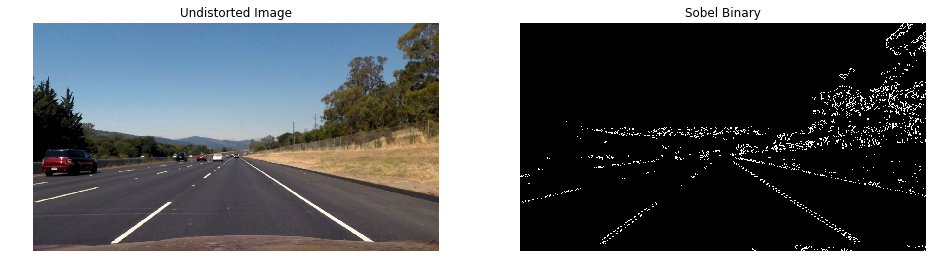

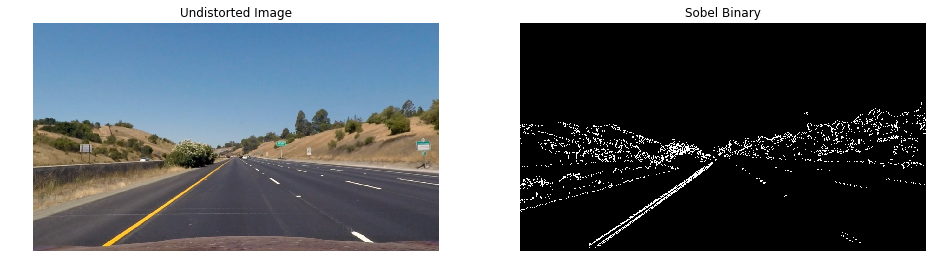

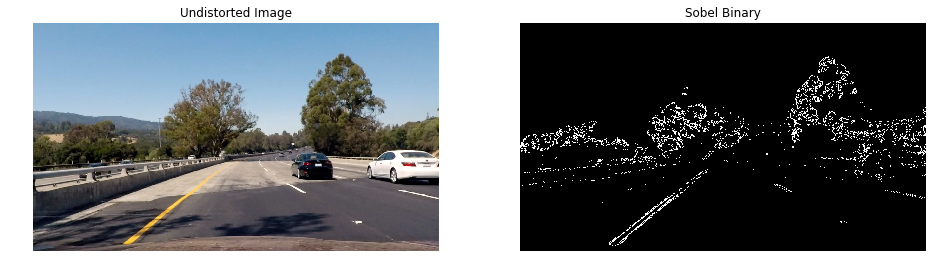

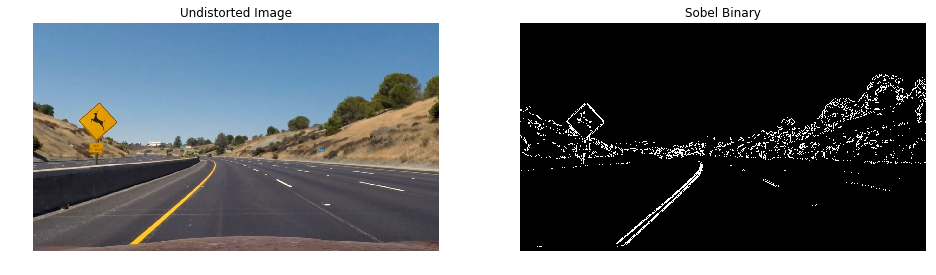

In [15]:
for img1, img2 in zip(dst_imgs, sobel_bin):
    plot_two(img1, img2, 'Undistorted Image', 'Sobel Binary', cmap2='gray')

### Perspective Transform

In [16]:
warp_bin = []
for img in dst_bin:
    warped, _, _ = perspective_transform(img, calc_points=True)
    warp_bin.append(warped)

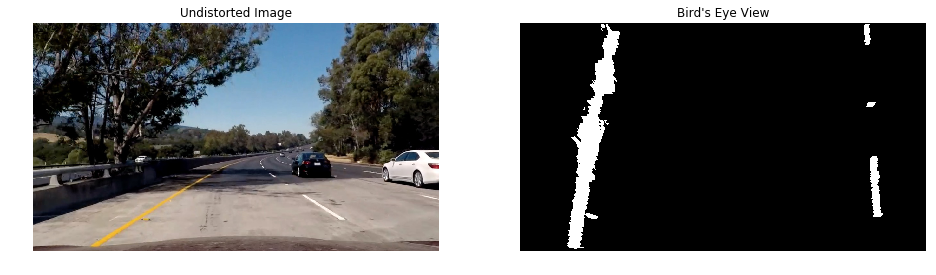

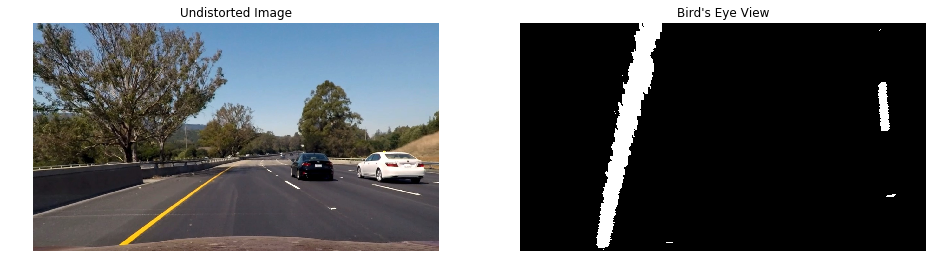

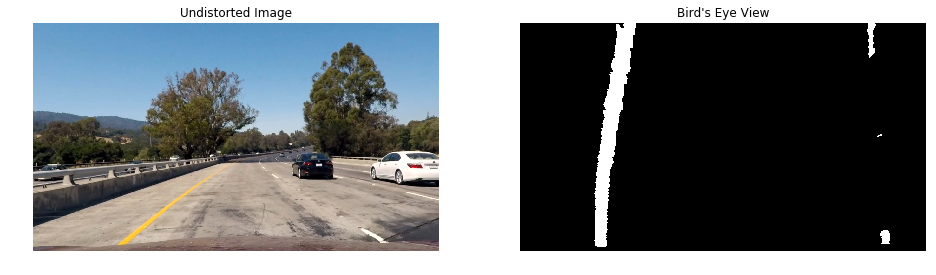

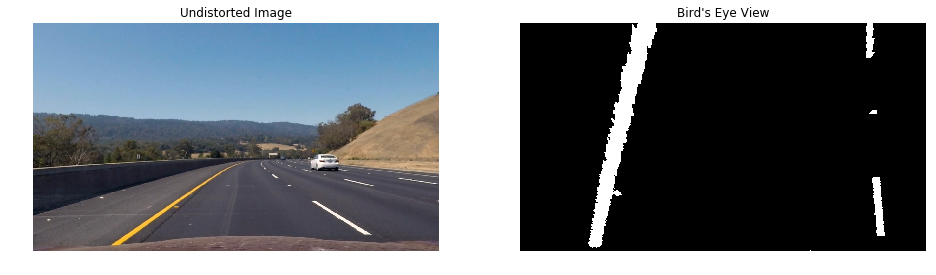

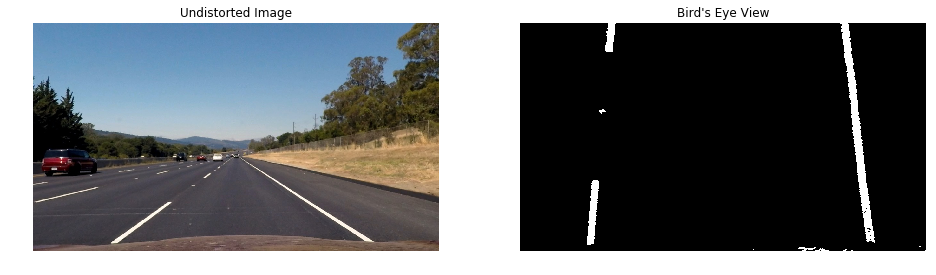

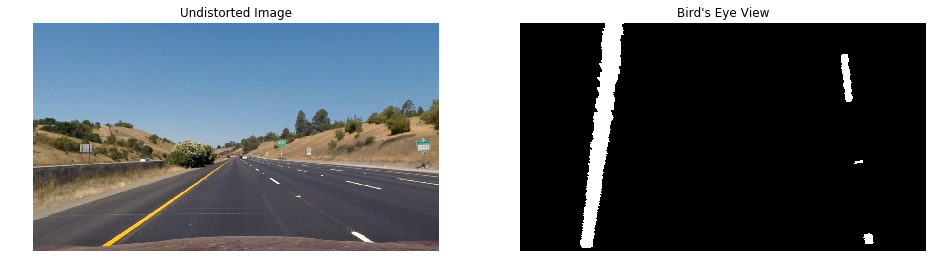

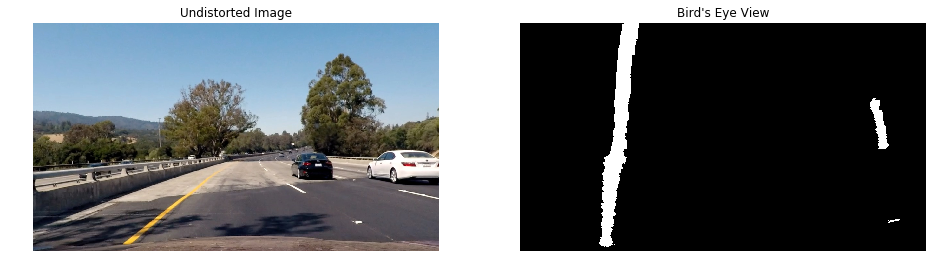

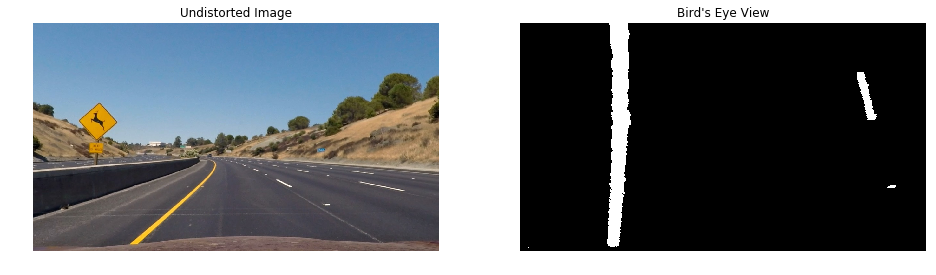

In [17]:
for img1, img2 in zip(dst_imgs, warp_bin):
    plot_two(img1, img2, 'Undistorted Image', 'Bird\'s Eye View', cmap2='gray')

### Fitting a polynomial to lane lines

In [18]:
left_fit, right_fit, out_img = find_line_raw(warp_bin[5], return_img=True, plot_boxes=True, plot_line=True)

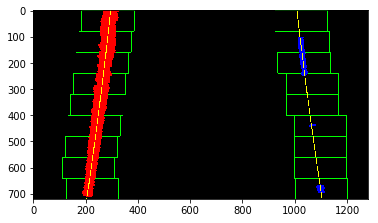

In [19]:
plt.imshow(out_img)

In [20]:
left_fit, right_fit, out_img = find_line_recursive(warp_bin[5], left_fit, right_fit, margin=100, return_img=True, plot_boxes=True, plot_line=True)

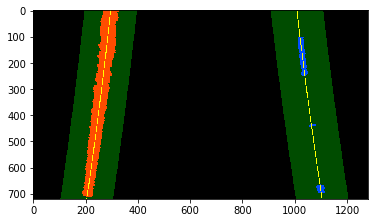

In [21]:
plt.imshow(out_img)

### Putting it all together

In [22]:
test_result = []
for img in dst_imgs:
    test = test_img_pipeline(img)
    test_result.append(test)

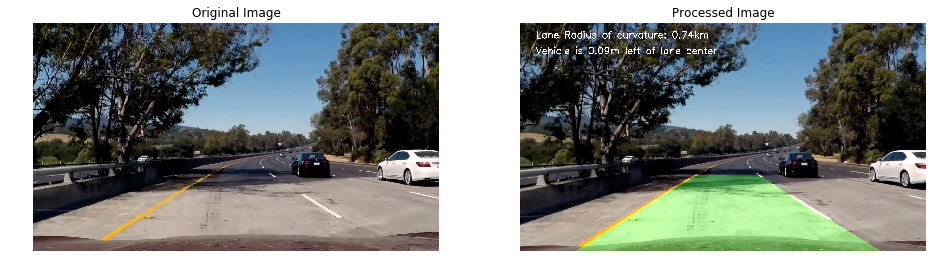

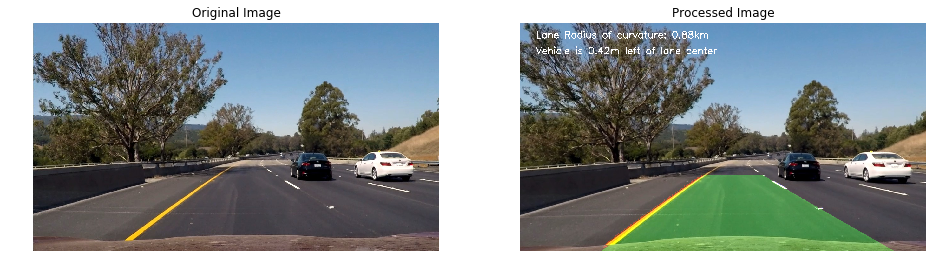

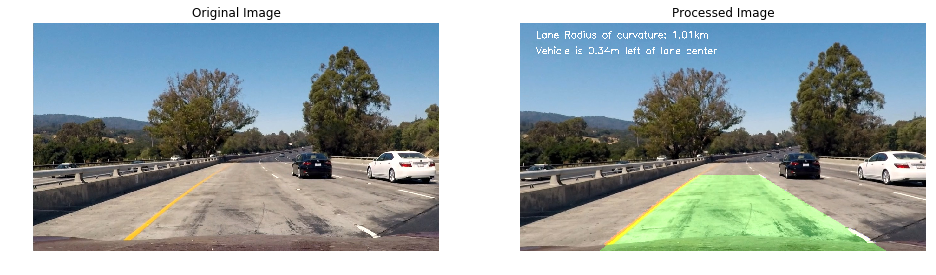

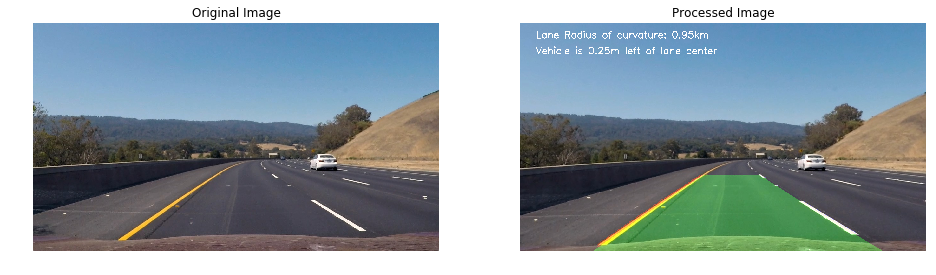

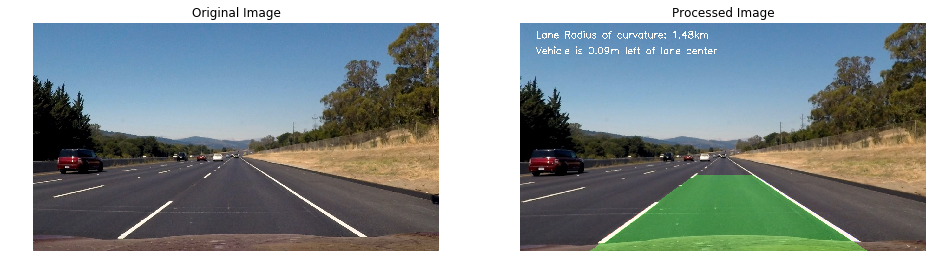

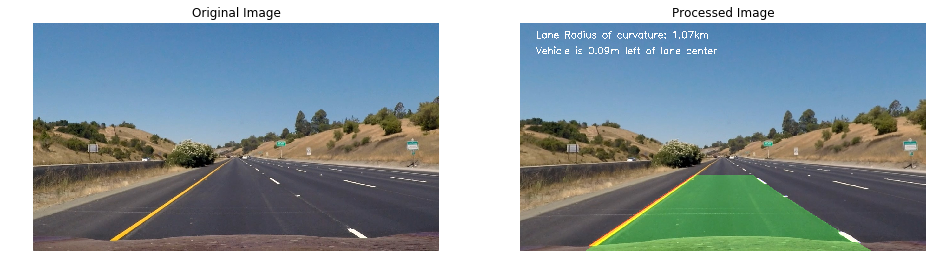

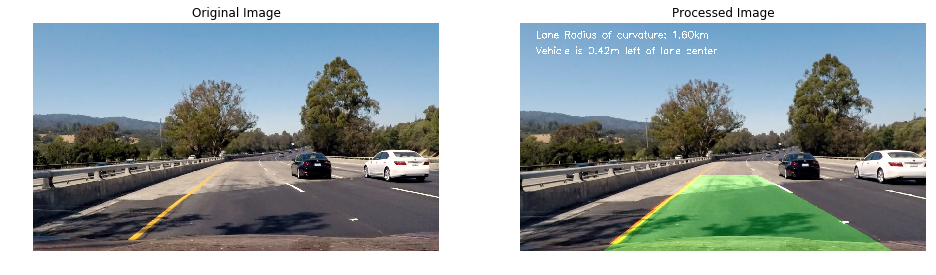

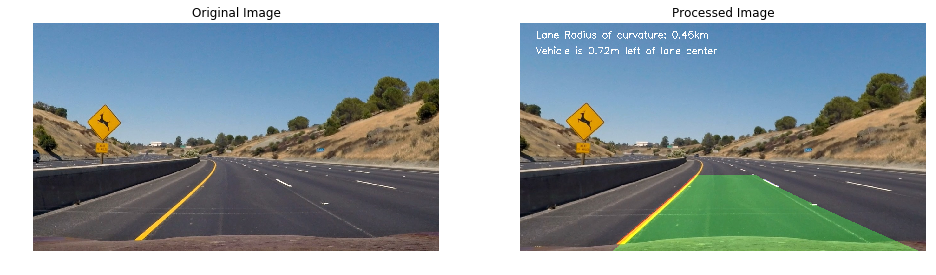

In [23]:
for img1, img2 in zip(tst_imgs, test_result):
    plot_two(img1, img2, 'Original Image', 'Processed Image')

### LaneLine class

As we can see the tools we have created so far are enough to find lines in several individual test images, but if we try to run them on a video stream the lines won't have any continuity and our lane line will be jittering from frame to frame.

To solve that we need a Class to wrap these lines and control how they change from frame to frame.

Some of the line attributes are:

    - current polynomial fit
    - curvature
    - last time a good fit was detected
    - best_fit (as controlled by several parameters) vs current_fit

All the code for the line class can be found by running the next cell.

In [24]:
??laneline.Line()

### Process Videos

In [25]:
def process_image(image):
    return new_video_pipeline(image, leftline, rightline)

In [ ]:
leftline = laneline.Line(name='left', dist_thres=0, slope_thres=0, curv_thres=0.6)
rightline = laneline.Line(name='right',dist_thres=0, slope_thres=0, curv_thres=0.6)

easy_output = path+'/video_output/project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")

easy_clip = clip1.fl_image(process_image)

%time easy_clip.write_videofile(easy_output, audio=False)

In [ ]:
# For this step we loosen the distance threshold a little bit and compensate by introducing some slope threshold.
leftline = Line(name='left', dist_thres=75, slope_thres=0)
rightline = Line(name='right',dist_thres=75, slope_thres=0)

challenge_output = path+'/video_output/challenge.mp4'
clip2 = VideoFileClip("challenge_video.mp4")

challenge_clip = clip2.fl_image(process_image)

%time challenge_clip.write_videofile(challenge_output, audio=False)

In [ ]:
leftline = Line(name='left', dist_thres=0, slope_thres=0, curv_thres=0.8)
rightline = Line(name='right',dist_thres=0, slope_thres=0, curv_thres=0.8)

hard_output = path+'/video_output/hard.mp4'
clip3 = VideoFileClip("harder_challenge_video.mp4")

hard_clip = clip3.fl_image(process_image)

%time hard_clip.write_videofile(hard_output, audio=False)